In [1]:
import numpy as np
import matplotlib.pyplot as plt

##funzioni

In [2]:
#funzioni
def accel_x(cd,rho,A,V,Vx,m): #accelerazione lungo x
    return -(cd*rho*A*V*Vx)/(2*m)
def accel_y(cd,rho,A,V,Vy,m,g): #accelerazione lungo y
    return -(cd*rho*A*V*Vy)/(2*m) -g 
def g_r(h): #gravità dipendente dalla quota
    g = 9.81 #m/s^2
    r = 6373.04 * 10**3 #m raggio terrestre
    g_real = g * (r/(r+h))**2
    return g_real

##Dati iniziali

Forza di attrito viscoso:
$F_{attr}$ = -$\frac{C_{d}\cdot \rho \cdot A ⋅ V^{2}}{2}$



Lungo x agisce la componente x di questa forza, lungo y la componente y e la forza peso dell'oggetto. Quindi:





$\ddot{x}$ = -$\frac{C_{d}\cdot \rho \cdot A ⋅ V^{2}}{2m}$ $\cos\theta$ 




$\ddot{y}$ = -$\frac{C_{d}\cdot \rho \cdot A ⋅ V^{2}}{2m}$ $\sin\theta$ - g(y)









Dipendenza di g dalla quota (r raggio terrestre):




g(y) = g ⋅ $(\frac{r}{r+y})^{2}$

In [3]:
#dati simulazione
Vo = 200 #m/s velocità iniziale  #nota per animazione: velocità 200m/s
g = 9.81 #m/s^2 (caso ideale)
m = 0.125 #kg massa dell'oggetto
theta_0 = np.radians(45) #Angolo di tiro (dato tra le parentesi in gradi)
Vxo = Vo * np.cos(theta_0)
Vyo = Vo * np.sin(theta_0)
Xo = 0 #posizione X iniziale
Yo = 0 #posizione Y iniziale

#aggiunte per l'attrito viscoso:
go = g_r(Yo) #g dipendente dalla quota
#dati forza di attrito
rho = 1.150 #kg/m^3 densità dell'aria
cd = 1 #coefficiente di resistenza aerodinamica
A = 3.142 * 10**-4 #m^2 - sezione dell'oggetto 

In [4]:
#griglia
time = 100  #tempo di analisi
N = 1000
time_step = time/N
t = np.arange(0,time+time_step,time_step)

#Confronto tra caso ideale e reale

In [21]:
#caso ideale
X_t_ideal = np.array([])
X_t_ideal = np.append(X_t_ideal,Xo)
Y_t_ideal = np.array([])
Y_t_ideal = np.append(Y_t_ideal,Yo)
energia_ideal = np.array([])
energia_ideal = np.append(energia_ideal, m * g * Yo + 0.5 * m * Vo**2)
for i in range(1,N-1): 
        X_t_ideal = np.append(X_t_ideal,Xo + (Vxo * time_step * i))
        Y_t_ideal = np.append(Y_t_ideal,Yo + (Vyo * time_step * i) - (0.5 * g * (time_step * i)**2)) 
        energia_ideal = np.append(energia_ideal, m * g * Y_t_ideal[i] + 0.5 * m * (Vxo**2 + (Vyo-(i*g*time_step))**2)) #energia totale
        if Y_t_ideal[i] <= 0: break

In [22]:
#caso reale
#RUNGE-KUTTA 4 PTI
#moto lungo y: 
Y_t = []
Y_t.append(Yo)
Vy_t = []
Vy_t.append(Vyo)
#moto lungo x
X_t = []
X_t.append(Xo)
Vx_t = []
Vx_t.append(Vxo)
#variabile aggiornata nel ciclo for
V_update = Vo 
g_update = go
#tengo traccia dell'energia e di g
energia = np.array([])
energia = np.append(energia,m*go*Yo + 0.5*m*Vo**2)
gravità = np.array([])
gravità = np.append(gravità, go)
#salvo i valori dell'accelerazione istante per istante
acc_x = []
acc_x.append(accel_x(cd,rho,A,V_update,Vxo,m))
acc_y = []
acc_y.append(accel_y(cd,rho,A,V_update,Vyo,m,go))

#RUNGE-KUTTA 4 PTI
for i in range(0,N-1): 
    if Y_t[i] < 0: break
    else:
        X1 = X_t[i]
        Vx1 = Vx_t[i]
        Y1 = Y_t[i]
        Vy1 = Vy_t[i]
    
        X2 = X_t[i] + Vx1*(time_step/2)
        Vx2 = Vx_t[i] + accel_x(cd,rho,A,V_update,Vx1,m) *(time_step/2)
        Y2 = Y_t[i] + Vy1*(time_step/2)
        Vy2 = Vy_t[i] + accel_y(cd,rho,A,V_update,Vy1,m,g_update) *(time_step/2)
    
        X3 = X_t[i] + Vx2*(time_step/2)
        Vx3 = Vx_t[i] + accel_x(cd,rho,A,V_update,Vx2,m) *(time_step/2)
        Y3 = Y_t[i] + Vy2* (time_step/2)
        Vy3 = Vy_t[i] + accel_y(cd,rho,A,V_update,Vy2,m,g_update) *(time_step/2)
    
        X4 = X_t[i] + Vx3*(time_step/2)
        Vx4 = Vx_t[i] + accel_x(cd,rho,A,V_update,Vx3,m) *(time_step/2)
        Y4 = Y_t[i] + Vy3 * time_step
        Vy4 = Vy_t[i] + accel_y(cd,rho,A,V_update,Vy3,m,g_update) * (time_step)
    
        #aggiorno variabili
        X_t.append(X_t[i] + (Vx1 + 2*Vx2 + 2*Vx3 + Vx4) * (time_step/6))
        Vx_t.append(Vx_t[i] + (accel_x(cd,rho,A,V_update,Vx1,m) + 2*accel_x(cd,rho,A,V_update,Vx2,m) + 2*accel_x(cd,rho,A,V_update,Vx3,m) + accel_x(cd,rho,A,V_update,Vx4,m)) * (time_step/6))
        
        Y_t.append(Y_t[i] + (Vy1 + 2*Vy2 + 2*Vy3 + Vy4) * (time_step/6))
        Vy_t.append(Vy_t[i] + (accel_y(cd,rho,A,V_update,Vy1,m,g_update) + 2*accel_y(cd,rho,A,V_update,Vy2,m,g_update) + 2*accel_y(cd,rho,A,V_update,Vy3,m,g_update) + accel_y(cd,rho,A,V_update,Vy4,m,g_update)) * (time_step/6))
        
        #aggiungo i valori istante per istante
        acc_x.append(accel_x(cd,rho,A,V_update,Vx_t[i+1],m))
        acc_y.append(accel_y(cd,rho,A,V_update,Vy_t[i+1],m,g_update))

        V_update = np.sqrt(Vx_t[i+1]**2 + Vy_t[i+1]**2)
        g_update = g_r(Y_t[i+1])
        
        energia = np.append(energia, m * g_update * Y_t[i+1] + 0.5 * m * V_update**2)
        gravità = np.append(gravità, g_update)




RISULTATI:
 
----------------------------------------------------------------
	 	 	 	 CASO IDEALE 	 CASO REALE
----------------------------------------------------------------
Distanza percorsa: 	 4087.077195258245 m 	 931.9391304206388 m
altezza massima: 	 1019.3667298172566 m 	 378.6831412809546 m
tempo di volo: 	 	 28.83208078232609 s 	 17.400000000000002 s


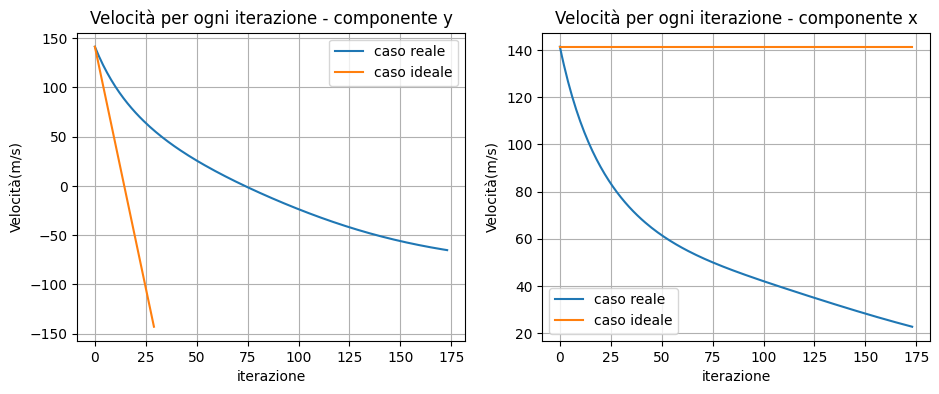

In [25]:
#risultati
print("RISULTATI:")
print(" ")
print("----------------------------------------------------------------")
print("\t","\t","\t","\t","CASO IDEALE", "\t", "CASO REALE")
print("----------------------------------------------------------------")
print("Distanza percorsa:","\t",X_t_ideal[-1],"m", "\t",X_t[-1],"m")
print("altezza massima:","\t", np.max(Y_t_ideal),"m", "\t",np.max(Y_t),"m")
print("tempo di volo:","\t","\t", (2*Vyo/g) + ((2*Yo)/(g*np.cos(theta_0))),"s", "\t", time_step*len(X_t),"s") 
#grafici vari
"""
acc_x = np.array(acc_x)
acc_y = np.array(acc_y)
mod_acc = np.sqrt(acc_x**2 + acc_y**2)
plt.plot(X_t,acc_x)
plt.plot(Y_t,acc_y)
"""
plt.figure(figsize=(11,4))
plt.subplot(121)
plt.xlabel("iterazione")
plt.ylabel("Velocità(m/s)")
plt.grid()
plt.title("Velocità per ogni iterazione - componente y")
plt.plot(Vy_t, label = "caso reale")
steps = np.arange(0,30,1)
plt.plot(Vyo-(g*steps),label = 'caso ideale') #grafico teorico
plt.legend()

plt.subplot(122)
plt.xlabel("iterazione")
plt.ylabel("Velocità(m/s)")
plt.grid()
plt.title("Velocità per ogni iterazione - componente x")
plt.plot(Vx_t, label = "caso reale")
plt.plot(np.full(len(Vx_t),Vxo), label = "caso ideale") #grafico teorico
plt.legend()


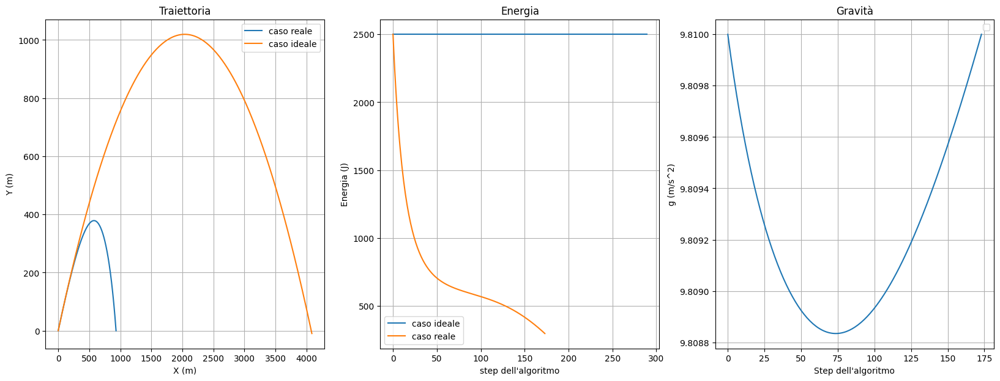

In [8]:
plt.rcdefaults()
#grafici
plt.figure(figsize=(20,7))
plt.subplot(131)
plt.title("Traiettoria")
plt.plot(X_t,Y_t, label = "caso reale")
plt.plot(X_t_ideal,Y_t_ideal, label= "caso ideale")
plt.xlabel("X (m)")
plt.ylabel("Y (m)")
plt.grid()
plt.legend()

plt.subplot(132)
plt.title("Energia")
plt.plot(energia_ideal,label = 'caso ideale')
plt.plot(energia, label = 'caso reale')
plt.ylabel("Energia (J)")
plt.xlabel("step dell'algoritmo")
plt.grid()
plt.legend()

plt.subplot(133)
plt.plot(gravità)
plt.title("Gravità")
plt.ylabel("g (m/s^2)")
plt.xlabel("Step dell'algoritmo")
plt.grid()

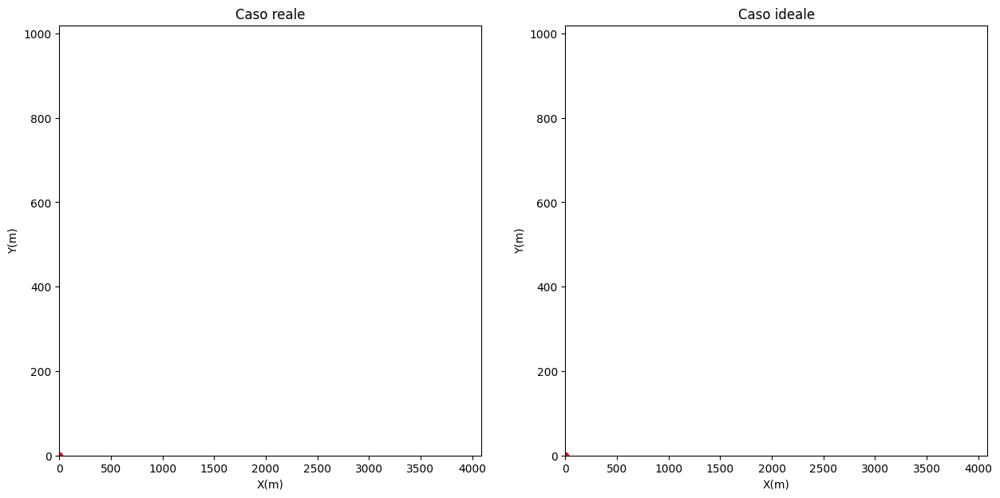

In [9]:
from matplotlib.animation import FuncAnimation
from matplotlib import rc
rc('animation', html='jshtml')

#Creo figura coi due subplot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

#Sistemo gli assi
ax1.set_xlim(X_t_ideal[0], X_t_ideal[-1])
ax1.set_ylim(Yo, np.max(Y_t_ideal))
ax1.set_xlabel('X(m)')
ax1.set_ylabel('Y(m)')
ax1.set_title('Caso reale')

ax2.set_xlim(X_t_ideal[0], X_t_ideal[-1])
ax2.set_ylim(Yo, np.max(Y_t_ideal))
ax2.set_xlabel('X(m)')
ax2.set_ylabel('Y(m)')
ax2.set_title('Caso ideale')

#Definisco oggetti linea
line1, = ax1.plot([], [])
line2, = ax2.plot([], [])

#Oggetti punto per il proiettile
point1, = ax1.plot([], [], 'ro')
point2, = ax2.plot([], [], 'ro')



#Animazione:
def update(frame):
    # Aggiorno i dati
    line1.set_data(X_t[:frame], Y_t[:frame])
    line2.set_data(X_t_ideal[:frame], Y_t_ideal[:frame])

    # Aggiorno il moto del punto (proiettile)
    point1.set_data(X_t[frame], Y_t[frame])
    point2.set_data(X_t_ideal[frame], Y_t_ideal[frame])

    # Ritorno gli oggetti
    return [line1, line2, point1, point2]

# Creo l'animazione
ani = FuncAnimation(fig, update, frames=len(X_t), interval=50)

In [10]:
ani

#Tiro con attrito a varie angolazioni e gittata

Text(0, 0.5, 'Y (m)')

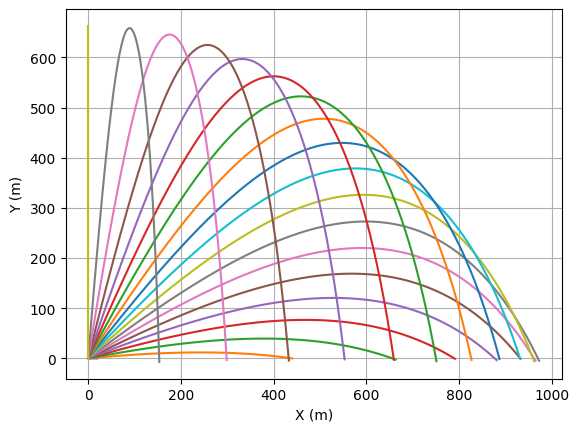

In [32]:
angles = np.radians(np.arange(0,95,5)) #array con le angolazioni di tiro
#RUNGE-KUTTA 4 PTI
Vox = Vo * np.cos(angles)
Voy = Vo * np.sin(angles)
#tengo conto della gittata:
gittata = np.array([])
for j in range(len(angles)):
  Y_t = []
  Y_t.append(Yo)
  Vy_t = []
  X_t = []
  X_t.append(Xo)
  Vx_t = []
  Vx_t.append(Vox[j])
  Vy_t.append(Voy[j])
  V_update = Vo
  g_update = go  
  for i in range(0,N-1):
      if Y_t[i] < 0: break
      else:
        X1 = X_t[i]
        Vx1 = Vx_t[i]
        Y1 = Y_t[i]
        Vy1 = Vy_t[i]
    
        X2 = X_t[i] + Vx1*(time_step/2)
        Vx2 = Vx_t[i] + accel_x(cd,rho,A,V_update,Vx1,m) *(time_step/2)
        Y2 = Y_t[i] + Vy1*(time_step/2)
        Vy2 = Vy_t[i] + accel_y(cd,rho,A,V_update,Vy1,m,g_update) *(time_step/2)
    
        X3 = X_t[i] + Vx2*(time_step/2)
        Vx3 = Vx_t[i] + accel_x(cd,rho,A,V_update,Vx2,m) *(time_step/2)
        Y3 = Y_t[i] + Vy2* (time_step/2)
        Vy3 = Vy_t[i] + accel_y(cd,rho,A,V_update,Vy2,m,g_update) *(time_step/2)
    
        X4 = X_t[i] + Vx3*(time_step/2)
        Vx4 = Vx_t[i] + accel_x(cd,rho,A,V_update,Vx3,m) *(time_step/2)
        Y4 = Y_t[i] + Vy3 * time_step
        Vy4 = Vy_t[i] + accel_y(cd,rho,A,V_update,Vy3,m,g_update) * (time_step)
    
        #aggiorno variabili
        X_t.append(X_t[i] + (Vx1 + 2*Vx2 + 2*Vx3 + Vx4) * (time_step/6))
        Vx_t.append(Vx_t[i] + (accel_x(cd,rho,A,V_update,Vx1,m) + 2*accel_x(cd,rho,A,V_update,Vx2,m) + 2*accel_x(cd,rho,A,V_update,Vx3,m) + accel_x(cd,rho,A,V_update,Vx4,m)) * (time_step/6))
        
        Y_t.append(Y_t[i] + (Vy1 + 2*Vy2 + 2*Vy3 + Vy4) * (time_step/6))
        Vy_t.append(Vy_t[i] + (accel_y(cd,rho,A,V_update,Vy1,m,g_update) + 2*accel_y(cd,rho,A,V_update,Vy2,m,g_update) + 2*accel_y(cd,rho,A,V_update,Vy3,m,g_update) + accel_y(cd,rho,A,V_update,Vy4,m,g_update)) * (time_step/6))
        
        V_update = np.sqrt(Vx_t[i+1]**2 + Vy_t[i+1]**2)
        g_update = g_r(Y_t[i])
        
  plt.plot(X_t,Y_t,label = np.round(angles[j],2))
  gittata = np.append(gittata,X_t[-1])
  #plt.legend() 
plt.grid()
plt.xlabel("X (m)")
plt.ylabel("Y (m)")



##gittata massima a varie angolazioni

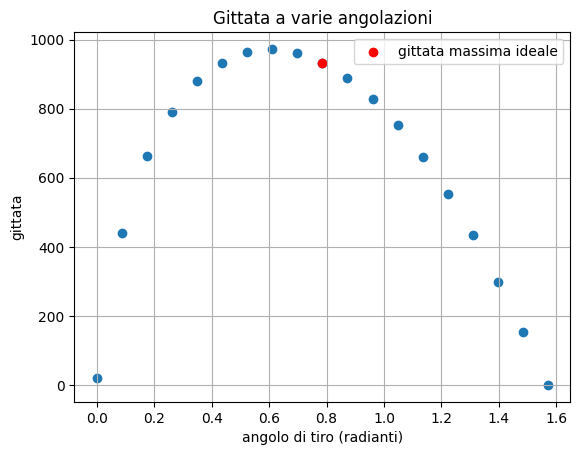

In [31]:
plt.scatter(angles,gittata)
plt.title("Gittata a varie angolazioni")
plt.xlabel("angolo di tiro (radianti)")
plt.ylabel("gittata")
plt.scatter(angles[9], gittata[9], color='red', label = 'gittata massima ideale')
plt.grid()
plt.legend()


#Simulazione sparo in diversi luoghi:

In [13]:
#Padova
Y_t_pd = []
Y_t_pd.append(12) #altezza Padova livello del mare
Vy_t_pd = []
Vy_t_pd.append(Vyo)

go_pd = g_r(Y_t_pd[0])
X_t_pd = []
X_t_pd.append(Xo)
Vx_t_pd = []
Vx_t_pd.append(Vxo)
V_update = Vo
g_update = go_pd

#RUNGE-KUTTA 4 PTI
for i in range(0,N-1): 
    if (Y_t_pd[i] < Y_t_pd[0]): break
    else:
        X1 = X_t_pd[i]
        Vx1 = Vx_t_pd[i]
        Y1 = Y_t_pd[i]
        Vy1 = Vy_t_pd[i]
    
        X2 = X_t_pd[i] + Vx1*(time_step/2)
        Vx2 = Vx_t_pd[i] + accel_x(cd,rho,A,V_update,Vx1,m) *(time_step/2)
        Y2 = Y_t_pd[i] + Vy1*(time_step/2)
        Vy2 = Vy_t_pd[i] + accel_y(cd,rho,A,V_update,Vy1,m,g_update) *(time_step/2)
    
        X3 = X_t_pd[i] + Vx2*(time_step/2)
        Vx3 = Vx_t_pd[i] + accel_x(cd,rho,A,V_update,Vx2,m) *(time_step/2)
        Y3 = Y_t_pd[i] + Vy2* (time_step/2)
        Vy3 = Vy_t_pd[i] + accel_y(cd,rho,A,V_update,Vy2,m,g_update) *(time_step/2)
    
        X4 = X_t_pd[i] + Vx3*(time_step/2)
        Vx4 = Vx_t_pd[i] + accel_x(cd,rho,A,V_update,Vx3,m) *(time_step/2)
        Y4 = Y_t_pd[i] + Vy3 * time_step
        Vy4 = Vy_t_pd[i] + accel_y(cd,rho,A,V_update,Vy3,m,g_update) * (time_step)
    
        #aggiorno variabili
        X_t_pd.append(X_t_pd[i] + (Vx1 + 2*Vx2 + 2*Vx3 + Vx4) * (time_step/6))
        Vx_t_pd.append(Vx_t_pd[i] + (accel_x(cd,rho,A,V_update,Vx1,m) + 2*accel_x(cd,rho,A,V_update,Vx2,m) + 2*accel_x(cd,rho,A,V_update,Vx3,m) + accel_x(cd,rho,A,V_update,Vx4,m)) * (time_step/6))
        
        Y_t_pd.append(Y_t_pd[i] + (Vy1 + 2*Vy2 + 2*Vy3 + Vy4) * (time_step/6))
        Vy_t_pd.append(Vy_t_pd[i] + (accel_y(cd,rho,A,V_update,Vy1,m,g_update) + 2*accel_y(cd,rho,A,V_update,Vy2,m,g_update) + 2*accel_y(cd,rho,A,V_update,Vy3,m,g_update) + accel_y(cd,rho,A,V_update,Vy4,m,g_update)) * (time_step/6))
        V_update = np.sqrt(Vx_t_pd[i+1]**2 + Vy_t_pd[i+1]**2)
        g_update = g_r(Y_t_pd[i+1])

        


In [14]:
Y_t_ev = []
Y_t_ev.append(8849) #altezza Everest livello del mare
Vy_t_ev = []
Vy_t_ev.append(Vyo)
rho_ev = 0.491

go_ev = g_r(Y_t_ev[0])
X_t_ev = []
X_t_ev.append(Xo)
Vx_t_ev = []
Vx_t_ev.append(Vxo)
V_update = Vo
g_update = go_ev
gravità_ev = []
gravità_ev.append(go_ev)
#RUNGE-KUTTA 4 PTI
for i in range(0,N-1): 
    if (Y_t_ev[i] < Y_t_ev[0]): break
    else:
        X1 = X_t_ev[i]
        Vx1 = Vx_t_ev[i]
        Y1 = Y_t_ev[i]
        Vy1 = Vy_t_ev[i]
    
        X2 = X_t_ev[i] + Vx1*(time_step/2)
        Vx2 = Vx_t_ev[i] + accel_x(cd,rho_ev,A,V_update,Vx1,m) *(time_step/2)
        Y2 = Y_t_ev[i] + Vy1*(time_step/2)
        Vy2 = Vy_t_ev[i] + accel_y(cd,rho_ev,A,V_update,Vy1,m,g_update) *(time_step/2)
    
        X3 = X_t_ev[i] + Vx2*(time_step/2)
        Vx3 = Vx_t_ev[i] + accel_x(cd,rho_ev,A,V_update,Vx2,m) *(time_step/2)
        Y3 = Y_t_ev[i] + Vy2* (time_step/2)
        Vy3 = Vy_t_ev[i] + accel_y(cd,rho_ev,A,V_update,Vy2,m,g_update) *(time_step/2)
    
        X4 = X_t_ev[i] + Vx3*(time_step/2)
        Vx4 = Vx_t_ev[i] + accel_x(cd,rho_ev,A,V_update,Vx3,m) *(time_step/2)
        Y4 = Y_t_ev[i] + Vy3 * time_step
        Vy4 = Vy_t_ev[i] + accel_y(cd,rho_ev,A,V_update,Vy3,m,g_update) * (time_step)
    
        #aggiorno variabili
        X_t_ev.append(X_t_ev[i] + (Vx1 + 2*Vx2 + 2*Vx3 + Vx4) * (time_step/6))
        Vx_t_ev.append(Vx_t_ev[i] + (accel_x(cd,rho_ev,A,V_update,Vx1,m) + 2*accel_x(cd,rho_ev,A,V_update,Vx2,m) + 2*accel_x(cd,rho_ev,A,V_update,Vx3,m) + accel_x(cd,rho_ev,A,V_update,Vx4,m)) * (time_step/6))
        
        Y_t_ev.append(Y_t_ev[i] + (Vy1 + 2*Vy2 + 2*Vy3 + Vy4) * (time_step/6))
        Vy_t_ev.append(Vy_t_ev[i] + (accel_y(cd,rho_ev,A,V_update,Vy1,m,g_update) + 2*accel_y(cd,rho_ev,A,V_update,Vy2,m,g_update) + 2*accel_y(cd,rho_ev,A,V_update,Vy3,m,g_update) + accel_y(cd,rho_ev,A,V_update,Vy4,m,g_update)) * (time_step/6))
        V_update = np.sqrt(Vx_t_ev[i+1]**2 + Vy_t_ev[i+1]**2)
        g_update = g_r(Y_t_ev[i+1])
        gravità_ev.append(g_update)



In [15]:
#"Normalizzo" le due traiettorie
Y_t_pd = np.array(Y_t_pd)
y_pd = Y_t_pd - 12

Y_t_ev = np.array(Y_t_ev)
y_ev = Y_t_ev - 8849




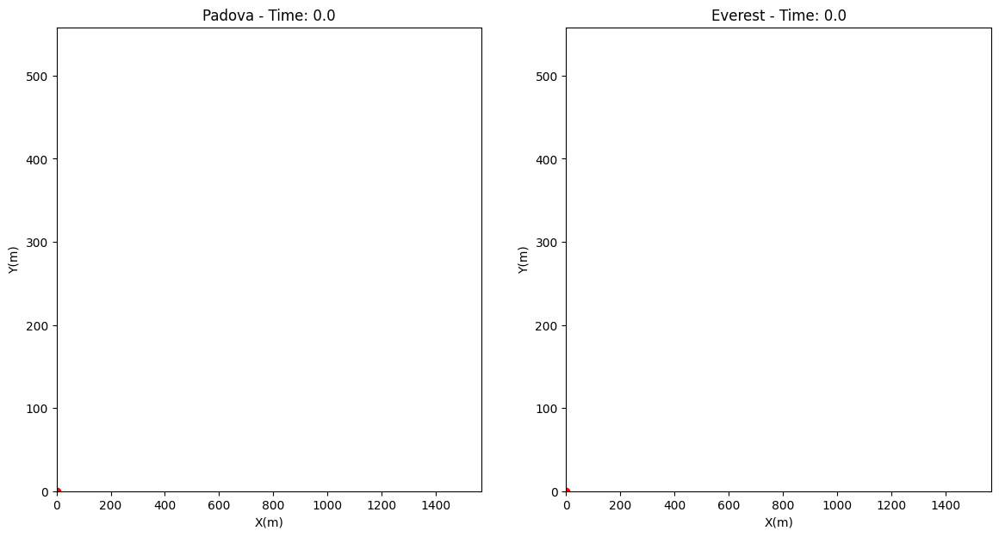

In [16]:
from matplotlib.animation import FuncAnimation
from matplotlib import rc
rc('animation', html='jshtml')

# Define your x and y data arrays
x1 = X_t_pd
y1 = y_pd

x2 = X_t_ev
y2 = y_ev

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))


ax1.set_xlim(x2[0], x2[-1])
ax1.set_ylim(0, np.max(y2))
ax1.set_xlabel('X(m)')
ax1.set_ylabel('Y(m)')
ax1.set_title('Padova')

ax2.set_xlim(x2[0], x2[-1])
ax2.set_ylim(0, np.max(y2))
ax2.set_xlabel('X(m)')
ax2.set_ylabel('Y(m)')
ax2.set_title('Everest')

line3, = ax1.plot([], [])
line4, = ax2.plot([], [])

#Oggetti punto per il proiettile
point3, = ax1.plot([], [], 'ro')
point4, = ax2.plot([], [], 'ro')

# Define the update function for the animation
def update(frame):
    # Update the data for each line
    line3.set_data(x1[:frame], y1[:frame])
    ax1.set_title(f'Padova - Time: {frame/10.0:.1f}')
    ax2.set_title(f'Everest - Time: {frame/10.0:.1f}')
    line4.set_data(x2[:frame], y2[:frame])

    point3.set_data(x1[frame], y1[frame])
    point4.set_data(x2[frame], y2[frame])

    # Return the line objects
    return [line3, line4, point3, point4]

# Create the animation-
ani2 = FuncAnimation(fig, update, frames=len(x1), interval=50)

In [17]:
ani2

#Importanza della densità dell'aria

-----------------------------------
GITTATA PER OGNI VALORE DI DENSITÀ
-----------------------------------
rho:  0.2 kg/m^3 	 gittata:  2379.02 m
rho:  0.4 kg/m^3 	 gittata:  1745.49 m
rho:  0.6 kg/m^3 	 gittata:  1400.58 m
rho:  0.8 kg/m^3 	 gittata:  1178.57 m
rho:  1.0 kg/m^3 	 gittata:  1023.3 m
rho:  1.2 kg/m^3 	 gittata:  907.82 m


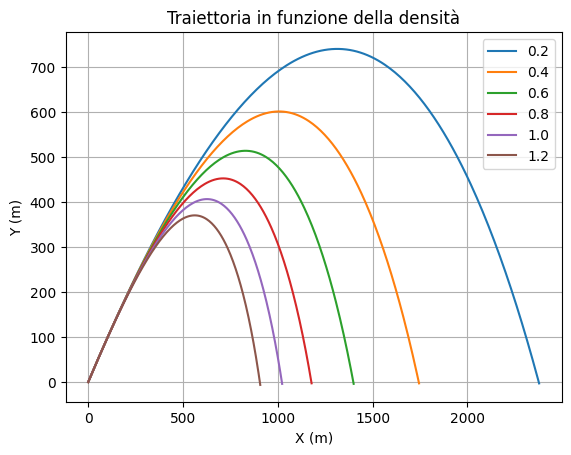

In [18]:
densities = np.arange(0.2,1.4,0.2)
#RUNGE-KUTTA 4 PTI
#tengo conto della gittata:
gittata2 = np.array([])
#inizializzo con i dati iniziali

for j in range(len(densities)):
  Y_t = []
  Y_t.append(Yo)
  Vy_t = []
  X_t = []
  X_t.append(Xo)
  Vx_t = []
  Vx_t.append(Vxo)
  Vy_t.append(Vyo)
  V_update = Vo
  g_update = go 
  for i in range(0,N-1):
      if Y_t[i] < 0: break
      else:
        X1 = X_t[i]
        Vx1 = Vx_t[i]
        Y1 = Y_t[i]
        Vy1 = Vy_t[i]
    
        X2 = X_t[i] + Vx1*(time_step/2)
        Vx2 = Vx_t[i] + accel_x(cd,densities[j],A,V_update,Vx1,m) *(time_step/2)
        Y2 = Y_t[i] + Vy1*(time_step/2)
        Vy2 = Vy_t[i] + accel_y(cd,densities[j],A,V_update,Vy1,m,g_update) *(time_step/2)
    
        X3 = X_t[i] + Vx2*(time_step/2)
        Vx3 = Vx_t[i] + accel_x(cd,densities[j],A,V_update,Vx2,m) *(time_step/2)
        Y3 = Y_t[i] + Vy2* (time_step/2)
        Vy3 = Vy_t[i] + accel_y(cd,densities[j],A,V_update,Vy2,m,g_update) *(time_step/2)
    
        X4 = X_t[i] + Vx3*(time_step/2)
        Vx4 = Vx_t[i] + accel_x(cd,densities[j],A,V_update,Vx3,m) *(time_step/2)
        Y4 = Y_t[i] + Vy3 * time_step
        Vy4 = Vy_t[i] + accel_y(cd,densities[j],A,V_update,Vy3,m,g_update) * (time_step)
    
        #aggiorno variabili
        X_t.append(X_t[i] + (Vx1 + 2*Vx2 + 2*Vx3 + Vx4) * (time_step/6))
        Vx_t.append(Vx_t[i] + (accel_x(cd,densities[j],A,V_update,Vx1,m) + 2*accel_x(cd,densities[j],A,V_update,Vx2,m) + 2*accel_x(cd,densities[j],A,V_update,Vx3,m) + accel_x(cd,densities[j],A,V_update,Vx4,m)) * (time_step/6))
        
        Y_t.append(Y_t[i] + (Vy1 + 2*Vy2 + 2*Vy3 + Vy4) * (time_step/6))
        Vy_t.append(Vy_t[i] + (accel_y(cd,densities[j],A,V_update,Vy1,m,g_update) + 2*accel_y(cd,densities[j],A,V_update,Vy2,m,g_update) + 2*accel_y(cd,densities[j],A,V_update,Vy3,m,g_update) + accel_y(cd,densities[j],A,V_update,Vy4,m,g_update)) * (time_step/6))
        
        V_update = np.sqrt(Vx_t[i+1]**2 + Vy_t[i+1]**2)
        g_update = g_r(Y_t[i])
        
        
  plt.plot(X_t,Y_t,label = np.round(densities[j],2))
  gittata2 = np.append(gittata2,X_t[-1])
  #plt.legend() 
plt.grid()
plt.title("Traiettoria in funzione della densità")
plt.xlabel("X (m)")
plt.ylabel("Y (m)")
plt.legend()
print("-----------------------------------")
print("GITTATA PER OGNI VALORE DI DENSITÀ")
print("-----------------------------------")
for i in range(len(densities)):
  print("rho: ", np.round(densities[i],2), "kg/m^3","\t", "gittata: ", np.round(gittata2[i],2),"m")